In [2]:
# basics libraries
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters

# Libraries for maps
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Units libraries
import metpy.calc as mpcalc
from metpy.units import units

# Time libraries
import matplotlib.dates as mdates

# For metocean statistics
from metocean_stats import plots, tables

# Plots libraries
import matplotlib.colors as mcolors
import seaborn as sns
import matplotlib.colors as colors
from matplotlib.lines import Line2D

Dataset used for latitude, longitude definition

In [3]:
ds_0 = xr.open_dataset("C://Users//kosta//OneDrive//Desktop//Διπλωματική//Results//Maps_diff//hs_mean_diff01.nc", engine="h5netcdf")
ds_0

<xarray.Dataset> Size: 16MB
Dimensions:    (time: 1, bnds: 2, latitude: 787, longitude: 1651)
Coordinates:
    latitude   (latitude, longitude) float32 5MB ...
    longitude  (latitude, longitude) float32 5MB ...
  * time       (time) datetime64[ns] 8B 2020-01-16T11:30:00
Dimensions without coordinates: bnds
Data variables:
    time_bnds  (time, bnds) datetime64[ns] 16B ...
    diff       (time, latitude, longitude) float32 5MB ...
Attributes: (12/22)
    CDI:                              Climate Data Interface version 1.9.6 (h...
    Conventions:                      CF-1.6
    WAVEWATCH_III_version_number:     6.07
    WAVEWATCH_III_switches:           F90 NOGRB NC4 SHRD PR3 UQ FLX0 LN1 ST4 ...
    SIN4 namelist parameter BETAMAX:  1.55
    product_name:                     ww3.run_with_currents202001.nc
    ...                               ...
    start_date:                       2020-01-01 00:00:00
    stop_date:                        2020-01-31 23:00:00
    CDO:                              Climate Data Operators version 1.9.6 (h...
    history:                          Thu Oct  9 13:26:05 2025: ncks -A lan_l...
    history_of_appended_files:        Thu Oct  9 13:26:05 2025: Appended file...
    NCO:                              "4.5.2"

Bathymetry dataset

In [4]:
ds_bathy = xr.open_dataset("c://Users//kosta//OneDrive//Desktop//Διπλωματική//Grid//MED36_bathy_meter.nc", engine="scipy")
ds_bathy

<xarray.Dataset> Size: 16MB
Dimensions:     (Y: 787, X: 1651)
Coordinates:
  * X           (X) int32 7kB 1 2 3 4 5 6 7 ... 1646 1647 1648 1649 1650 1651
  * Y           (Y) int32 3kB 1 2 3 4 5 6 7 8 ... 781 782 783 784 785 786 787
Data variables:
    nav_lon     (Y, X) float32 5MB ...
    nav_lat     (Y, X) float32 5MB ...
    Bathymetry  (Y, X) float32 5MB ...
Attributes:
    Conventions:    CF-1.5
    Grid:           ARAKAWA-C
    Created_by:     SIREN create_bathy
    Creation_date:  2017-01-19 13:00:32
    periodicity:    0.0
    history:        Tue Mar  7 14:42:16 2017: ncrename -d x,X -d y,Y test.nc....

In [5]:
# rename variables inside netcdf dataset
ds_bathy = ds_bathy.rename({"Y": "latitude", "X": "longitude"})
ds_bathy

<xarray.Dataset> Size: 16MB
Dimensions:     (latitude: 787, longitude: 1651)
Coordinates:
  * longitude   (longitude) int32 7kB 1 2 3 4 5 6 ... 1647 1648 1649 1650 1651
  * latitude    (latitude) int32 3kB 1 2 3 4 5 6 7 ... 782 783 784 785 786 787
Data variables:
    nav_lon     (latitude, longitude) float32 5MB ...
    nav_lat     (latitude, longitude) float32 5MB ...
    Bathymetry  (latitude, longitude) float32 5MB ...
Attributes:
    Conventions:    CF-1.5
    Grid:           ARAKAWA-C
    Created_by:     SIREN create_bathy
    Creation_date:  2017-01-19 13:00:32
    periodicity:    0.0
    history:        Tue Mar  7 14:42:16 2017: ncrename -d x,X -d y,Y test.nc....

Define datasets

In [6]:
# No currents 
ds_1 = xr.open_dataset("c://Users//kosta//OneDrive//Desktop//Διπλωματική//Results//Analysis//Pure analysis//Snapshots_analysis//standard_no_cur_snapshots.nc", engine="h5netcdf")
ds_1

<xarray.Dataset> Size: 31MB
Dimensions:  (time: 2, latitude: 787, longitude: 1651)
Coordinates:
  * time     (time) datetime64[ns] 16B 2020-01-29T01:00:00 2020-01-31T06:00:00
Dimensions without coordinates: latitude, longitude
Data variables:
    dir      (time, latitude, longitude) float32 10MB ...
    hs       (time, latitude, longitude) float32 10MB ...
    t01      (time, latitude, longitude) float32 10MB ...
Attributes: (12/22)
    CDI:                              Climate Data Interface version 1.9.6 (h...
    Conventions:                      CF-1.6
    WAVEWATCH_III_version_number:     6.07
    WAVEWATCH_III_switches:           F90 NOGRB NC4 SHRD PR3 UQ FLX0 LN1 ST4 ...
    SIN4 namelist parameter BETAMAX:  1.55
    product_name:                     ww3.run_no_currents202001.nc
    ...                               ...
    start_date:                       2020-01-01 00:00:00
    stop_date:                        2020-01-31 23:00:00
    CDO:                              Climate Data Operators version 1.9.6 (h...
    history:                          Wed Jan 14 16:47:18 2026: ncks -C -O -x...
    history_of_appended_files:        Wed Jan 14 16:41:48 2026: Appended file...
    NCO:                              "4.5.2"

In [7]:
# Difference between two runs
ds_2 = xr.open_dataset("c://Users//kosta//OneDrive//Desktop//Διπλωματική//Results//Analysis//Pure analysis//Snapshots_analysis//standard_diff_snapshots.nc", engine="h5netcdf")
ds_2

<xarray.Dataset> Size: 31MB
Dimensions:  (time: 2, latitude: 787, longitude: 1651)
Coordinates:
  * time     (time) datetime64[ns] 16B 2020-01-29T01:00:00 2020-01-31T06:00:00
Dimensions without coordinates: latitude, longitude
Data variables:
    hs       (time, latitude, longitude) float32 10MB ...
    dir      (time, latitude, longitude) float32 10MB ...
    t01      (time, latitude, longitude) float32 10MB ...
Attributes: (12/22)
    CDI:                              Climate Data Interface version 1.9.6 (h...
    Conventions:                      CF-1.6
    WAVEWATCH_III_version_number:     6.07
    WAVEWATCH_III_switches:           F90 NOGRB NC4 SHRD PR3 UQ FLX0 LN1 ST4 ...
    SIN4 namelist parameter BETAMAX:  1.55
    product_name:                     ww3.run_with_currents_new_stan202001.nc
    ...                               ...
    start_date:                       2020-01-01 00:00:00
    stop_date:                        2020-01-31 23:00:00
    CDO:                              Climate Data Operators version 1.9.6 (h...
    history:                          Wed Jan 14 16:48:21 2026: ncks -A addit...
    history_of_appended_files:        Wed Jan 14 16:48:21 2026: Appended file...
    NCO:                              "4.5.2"

In [8]:
# Forcings
ds_3 = xr.open_dataset("c://Users//kosta//OneDrive//Desktop//Διπλωματική//Results//Analysis//Pure analysis//Snapshots_analysis//forcings_snapshots.nc", engine="h5netcdf")
ds_3

<xarray.Dataset> Size: 42MB
Dimensions:  (time: 2, latitude: 787, longitude: 1651)
Coordinates:
  * time     (time) datetime64[ns] 16B 2020-01-29T01:00:00 2020-01-31T06:00:00
Dimensions without coordinates: latitude, longitude
Data variables:
    ucur     (time, latitude, longitude) float32 10MB ...
    vcur     (time, latitude, longitude) float32 10MB ...
    uwnd     (time, latitude, longitude) float32 10MB ...
    vwnd     (time, latitude, longitude) float32 10MB ...
Attributes: (12/20)
    CDI:                              Climate Data Interface version 1.9.6 (h...
    Conventions:                      CF-1.6
    history:                          Wed Jan 14 15:37:03 2026: cdo -select,n...
    WAVEWATCH_III_version_number:     6.07
    WAVEWATCH_III_switches:           F90 NOGRB NC4 SHRD PR3 UQ FLX0 LN1 ST4 ...
    SIN4 namelist parameter BETAMAX:  1.55
    ...                               ...
    minimum_altitude:                 -12000 m
    maximum_altitude:                 9000 m
    altitude_resolution:              n/a
    start_date:                       2020-01-01 00:00:00
    stop_date:                        2020-01-31 23:00:00
    CDO:                              Climate Data Operators version 1.9.6 (h...

In [9]:
# With currents
ds_4 = xr.open_dataset("c://Users//kosta//OneDrive//Desktop//Διπλωματική//Results//Analysis//Pure analysis//Snapshots_analysis//standard_with_cur_snapshots.nc", engine="h5netcdf")
ds_4

<xarray.Dataset> Size: 31MB
Dimensions:  (time: 2, latitude: 787, longitude: 1651)
Coordinates:
  * time     (time) datetime64[ns] 16B 2020-01-29T01:00:00 2020-01-31T06:00:00
Dimensions without coordinates: latitude, longitude
Data variables:
    hs       (time, latitude, longitude) float32 10MB ...
    dir      (time, latitude, longitude) float32 10MB ...
    t01      (time, latitude, longitude) float32 10MB ...
Attributes: (12/22)
    CDI:                              Climate Data Interface version 1.9.6 (h...
    Conventions:                      CF-1.6
    WAVEWATCH_III_version_number:     6.07
    WAVEWATCH_III_switches:           F90 NOGRB NC4 SHRD PR3 UQ FLX0 LN1 ST4 ...
    SIN4 namelist parameter BETAMAX:  1.55
    product_name:                     ww3.run_with_currents_new_stan202001.nc
    ...                               ...
    start_date:                       2020-01-01 00:00:00
    stop_date:                        2020-01-31 23:00:00
    CDO:                              Climate Data Operators version 1.9.6 (h...
    history:                          Wed Jan 14 16:47:57 2026: ncks -A addit...
    history_of_appended_files:        Wed Jan 14 16:47:57 2026: Appended file...
    NCO:                              "4.5.2"

Assing coordinates to the data

In [10]:
ds_1 = ds_1.assign_coords(latitude=ds_0.latitude,longitude=ds_0.longitude)
ds_2 = ds_2.assign_coords(latitude=ds_0.latitude, longitude=ds_0.longitude)
ds_3 = ds_3.assign_coords(latitude=ds_0.latitude,longitude=ds_0.longitude)
ds_4 = ds_4.assign_coords(latitude=ds_0.latitude, longitude=ds_0.longitude)
ds_bathy = ds_bathy.assign_coords(latitude=ds_0.latitude,longitude=ds_0.longitude)
ds_bathy

<xarray.Dataset> Size: 26MB
Dimensions:     (latitude: 787, longitude: 1651)
Coordinates:
    latitude    (latitude, longitude) float32 5MB ...
    longitude   (latitude, longitude) float32 5MB ...
Data variables:
    nav_lon     (latitude, longitude) float32 5MB ...
    nav_lat     (latitude, longitude) float32 5MB ...
    Bathymetry  (latitude, longitude) float32 5MB ...
Attributes:
    Conventions:    CF-1.5
    Grid:           ARAKAWA-C
    Created_by:     SIREN create_bathy
    Creation_date:  2017-01-19 13:00:32
    periodicity:    0.0
    history:        Tue Mar  7 14:42:16 2017: ncrename -d x,X -d y,Y test.nc....

Define region of interest

In [11]:
Region_plots = "Asia Minor current"
Region_saves = "Asia Minor current"

Range_of_regions = {"range" : [27.5, 33, 35, 37]} # Asia Minor current
#Range_of_regions = {"range" : [28, 33, 35, 37]} # Algeria current


In [12]:
List_dataset_index = ["0","1","2","3","4","bathy"]
ds_model_list = [ds_0, ds_1, ds_2, ds_3, ds_4, ds_bathy]

for i in range(len(List_dataset_index)):
    globals()[f"ds_{List_dataset_index[i]}_sel"] = ds_model_list[i].where(
    (ds_0.longitude >= Range_of_regions["range"][0]) & 
    (ds_0.longitude <= Range_of_regions["range"][1]) &
    (ds_0.latitude >= Range_of_regions["range"][2]) & 
    (ds_0.latitude <= Range_of_regions["range"][3]),
    drop=True
)
    

Drawing region of interest

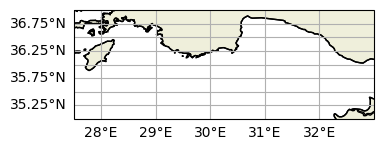

In [13]:
fig = plt.figure(figsize=(10,10)) 
ax = fig.add_axes([0.5, 1, 0.3, 0.2], projection=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.BORDERS, zorder=1, edgecolor='k')
ax.add_feature(cfeature.RIVERS, linewidth=0.5)
    
gl = ax.gridlines(draw_labels=True)
gl.right_labels = False
gl.top_labels = False

# Customize mini map
ax.add_feature(cfeature.LAND, zorder=0, edgecolor='k') # add land mask
# define the extent of the mini map [lon_min,lon_max,lat_min,lat_max]
ax.set_extent([Range_of_regions["range"][0], Range_of_regions["range"][1], 
               Range_of_regions["range"][2], Range_of_regions["range"][3]], 
               crs = ccrs.PlateCarree())               

Setting variables

In [14]:
# Setting variables from dataset

# Standard wave parameters : Hs, t01, t02, t0m1, fp, dir, spr, c_group, stepness, wavelength

# lat-lon
lon = ds_0_sel["longitude"]
lat = ds_0_sel["latitude"]

# diff
diff_hs = ds_2_sel["hs"][:,:,:]
diff_t01 = ds_2_sel["t01"][:,:,:]
#diff_spread = ds_2_sel["spr"][:,:,:]
diff_wave_dir = ds_2_sel["dir"][:,:,:]
#diff_fp = ds_2_sel["fp"][:,:,:]

# forcings
ucur = ds_3_sel["ucur"][:,:,:]
vcur = ds_3_sel["vcur"][:,:,:]
uwnd = ds_3_sel["uwnd"][:,:,:]
vwnd = ds_3_sel["vwnd"][:,:,:]

# no currents parameters
hs_no_cur = ds_1_sel["hs"][:,:,:]
t01_no_cur = ds_1_sel["t01"][:,:,:]
#spread_no_cur = ds_1_sel["spr"][:,:,:]
wave_dir_no_cur = ds_1_sel["dir"][:,:,:]
#fp_no_cur = ds_1_sel["fp"][:,:,:]

# with currents parameters
wave_dir_with_cur = ds_4_sel["dir"][:,:,:]
t01_with_cur = ds_4_sel["t01"][:,:,:]
hs_with_cur = ds_4_sel["hs"][:,:,:]

# Bathymetry
Bathymetry = ds_bathy_sel["Bathymetry"][:,:]

Setting values of variables & units

In [15]:
# lat-lon
lon2d = lon.values
lat2d = lat.values

# diff
diff_hs2d = diff_hs.values * units("m")
diff_t012d = diff_t01.values * units("s")
#diff_spread = diff_spread.values
diff_wave_dir2d = diff_wave_dir.values
#diff_fp2d = diff_fp.values * units("1/s")


# forcings
ucur2d = ucur.values * units("m/s") 
vcur2d = vcur.values * units("m/s")
uwnd2d = uwnd.values * units("m/s")
vwnd2d = vwnd.values * units("m/s")

# no currents parameters
hs_no_cur = hs_no_cur.values * units("m")
t01_no_cur = t01_no_cur.values * units("s")
#spread_no_cur = spread_no_cur.values
wave_dir_no_cur = wave_dir_no_cur.values
#fp_no_cur = fp_no_cur.values * units("1/s")

# with currents parameters
wave_dir_with_cur = wave_dir_with_cur.values
t01_with_cur = t01_with_cur.values * units("s")
hs_with_cur = hs_with_cur.values * units("m")

# Bathymetry
Bathymetry = Bathymetry.values * units("m")

Additional parameters

In [16]:
wnd_speed = np.sqrt(uwnd2d**2 + vwnd2d**2) 
cur_speed = np.sqrt(ucur2d**2 + vcur2d**2)
g = 9.81 * units("m/s**2")
c_phase_with_cur=(g*t01_with_cur)/(2*np.pi)
c_group_with_cur=(g*t01_with_cur)/(4*np.pi)
c_phase_no_cur=(g*t01_no_cur)/(2*np.pi)
c_group_no_cur=(g*t01_no_cur)/(4*np.pi)
wavelength_with_cur=(g*(t01_with_cur**2))/(2*np.pi)
wavelength_no_cur=(g*(t01_no_cur**2))/(2*np.pi)
stepness_with_cur = hs_with_cur/wavelength_with_cur
stepness_no_cur = hs_no_cur/wavelength_no_cur
wave_age_with_cur = c_phase_with_cur/wnd_speed
wave_age_no_cur = c_phase_no_cur/wnd_speed

c:\Users\kosta\AppData\Local\Programs\Python\Python313\Lib\site-packages\pint\facets\plain\quantity.py:1029: RuntimeWarning: divide by zero encountered in divide
  magnitude = magnitude_op(new_self._magnitude, other._magnitude)


In [17]:
diff_stepness2d = stepness_with_cur - stepness_no_cur
diff_wavelength = wavelength_with_cur - wavelength_no_cur
diff_c_group2d = c_group_with_cur - c_group_no_cur

Transforming wind and currents direction with respect to the meteorological convection

In [18]:
wnd_dir = np.degrees(np.arctan2(vwnd, uwnd))
wnd_dir = (270 - wnd_dir) % 360
cur_dir = np.degrees(np.arctan2(vcur, ucur))
cur_dir = (270 - cur_dir) % 360

Computation of wave components from wave direction

In [19]:
# WaveWatch direction: degrees, FROM, clockwise from North
D = wave_dir_no_cur  # shape (time, lat, lon)

# FROM -> TO
D_to = (D + 180) % 360

# Meteorological -> mathematical (radians)
theta = np.deg2rad(90 - D_to)

# Unit direction vectors
u_group_no_cur = c_group_no_cur*np.cos(theta)
v_group_no_cur = c_group_no_cur*np.sin(theta)

Computation of relative angles

In [20]:
angle_bet_cur_wave =  cur_dir - wave_dir_no_cur
angle_bet_cur_wnd = cur_dir - wnd_dir

Angle bet cur and wnd

In [21]:
rel_angle_cur_wnd = xr.where((wnd_dir < 180) & (angle_bet_cur_wnd <= 180), angle_bet_cur_wnd, xr.where(
    (wnd_dir < 180) & (angle_bet_cur_wnd > 180), angle_bet_cur_wnd - 360, xr.where(
        (wnd_dir > 180) & (angle_bet_cur_wnd >= -180), angle_bet_cur_wnd, xr.where(
            (wnd_dir > 180) & (angle_bet_cur_wnd < -180), 360 + angle_bet_cur_wnd, angle_bet_cur_wnd)
    ) 
))
np.nanmax(rel_angle_cur_wnd), np.nanmin(rel_angle_cur_wnd),np.shape(rel_angle_cur_wnd)

(np.float32(179.99754), np.float32(-179.97998), (2, 109, 200))

Angle bet cur and wave

In [22]:
rel_angle_wave = xr.where((wave_dir_no_cur < 180) & (angle_bet_cur_wave <= 180), angle_bet_cur_wave, xr.where(
    (wave_dir_no_cur < 180) & (angle_bet_cur_wave > 180), angle_bet_cur_wave - 360, xr.where(
        (wave_dir_no_cur > 180) & (angle_bet_cur_wave >= -180), angle_bet_cur_wave, xr.where(
            (wave_dir_no_cur > 180) & (angle_bet_cur_wave < -180), 360 + angle_bet_cur_wave, angle_bet_cur_wave)
    ) 
))
np.nanmax(rel_angle_wave), np.nanmin(rel_angle_wave),np.shape(rel_angle_wave)

(np.float32(179.98363), np.float32(-179.99704), (2, 109, 200))

Compute gradients, divergence and vorticity

In [23]:
# Compute grid spacing in meters
dx_g, dy_g = mpcalc.lat_lon_grid_deltas(lon2d, lat2d)
dx_g, dy_g

(<Quantity([[2529.78611141 2528.7409957  2528.80185746 ... 2530.95795964
   2530.62502853 2530.96085895]
  [2528.29114814 2528.14182261 2529.01597247 ... 2530.34573648
   2529.98615855 2530.37502568]
  [2528.56030355 2527.50644262 2527.53075267 ... 2529.38587045
   2529.74827338 2529.41552314]
  ...
  [2462.53787046 2462.58997482 2462.61399985 ... 2464.24405979
   2465.24249865 2465.64547357]
  [2461.90432815 2461.9703836  2461.99441921 ... 2464.64578101
   2464.00538455 2464.70612402]
  [2461.36990408 2461.35126352 2461.37530968 ... 2464.08664107
   2464.08234943 2463.42842242]], 'meter')>,
 <Quantity([[2254.60066616 2254.58190643 2253.30968027 ... 2208.74560797
   2210.01785489 2208.74561935]
  [2253.30941145 2252.05596359 2252.48004383 ... 2207.88989956
   2206.62497414 2206.61766581]
  [2251.2075437  2251.18877447 2250.78348296 ... 2206.62473031
   2206.62473608 2206.62474184]
  ...
  [2124.1499243  2123.7260025  2123.72602506 ... 2067.22352106
   2068.07145244 2067.23448605]
  [21

In [24]:
t,x,y = np.shape(diff_hs2d)[0], np.shape(diff_hs2d)[1], np.shape(diff_hs2d)[2]
t,x,y

(2, 109, 200)

In [25]:
"""grad_diff_hs = np.zeros((t,2,x,y))
grad_hs_no_cur = np.zeros((t,2,x,y))
grad_u = np.zeros((t,2,x,y))
grad_v = np.zeros((t,2,x,y))
grad_U = np.zeros((t,2,x,y))
div_hs_no_cur = np.zeros((t,x,y))
div_diff_hs = np.zeros((t,x,y))"""
div = np.zeros((t,x,y))
vor = np.zeros((t,x,y))
normal_vor = np.zeros((t,x,y))
omega = 7.2921*(10**(-5))
f = 2*omega*np.sin(np.deg2rad(lat2d))

for j in range(0,2):
    """gr_diff_hs = mpcalc.gradient(diff_hs2d[j], deltas=(dy_g, dx_g))
    gr_hs_no_cur = mpcalc.gradient(hs_no_cur[j], deltas=(dy_g, dx_g))
    gr_u = mpcalc.gradient(ucur2d[j], deltas=(dy_g, dx_g))
    gr_v = mpcalc.gradient(vcur2d[j], deltas=(dy_g, dx_g))
    gr_U = mpcalc.gradient(cur_speed[j], deltas=(dy_g, dx_g))
    d_hs_no_cur = mpcalc.divergence(hs_no_cur[j],hs_no_cur[j],dx=dx_g,dy=dy_g)
    d_diff_hs = mpcalc.divergence(diff_hs2d[j],diff_hs2d[j],dx=dx_g,dy=dy_g)"""
    d = mpcalc.divergence(ucur2d[j],vcur2d[j],dx=dx_g,dy=dy_g)
    v = mpcalc.vorticity(ucur2d[j],vcur2d[j],dx=dx_g,dy=dy_g)
    normal_v = (v)/(f)

    """grad_diff_hs[j] = gr_diff_hs
    grad_hs_no_cur[j] = gr_hs_no_cur
    grad_u[j] = gr_u
    grad_v[j] = gr_v
    grad_U[j] = gr_U
    div_hs_no_cur[j] = d_hs_no_cur
    div_diff_hs[j] = d_diff_hs"""
    div[j] = d
    vor[j] = v
    normal_vor[j] = normal_v

np.shape(div), np.shape(normal_vor), np.shape(vor)

((2, 109, 200), (2, 109, 200), (2, 109, 200))

Masking nan values

In [26]:
div_masked = np.ma.masked_invalid(div)
normal_vor_masked = np.ma.masked_invalid(normal_vor)
vor_masked = np.ma.masked_invalid(vor)

Style plots fuctions

In [27]:
import numpy as np
from scipy.stats import skew, kurtosis, normaltest

def adaptive_percentile_range(data):
    """
    Compute an adaptive percentile range for plotting, 
    depending on the data distribution.
    
    Returns (lower_bound, upper_bound, coverage_percent).
    """
    data = np.asarray(data)
    data = data[np.isfinite(data)]  # remove NaNs and infs

    # Basic distribution metrics
    s = skew(data)
    k = kurtosis(data)
    stat, pval = normaltest(data)  # normality test (null: normal)

    # Start with default 95% range
    coverage = 95.0
    
    # Adjust for heavy tails or skewed data
    if pval < 0.05:  # not normal
        if abs(s) > 1 or k > 3:       # strongly skewed or heavy tails
            coverage = 90.0
        elif abs(s) > 0.5 or k > 1:   # moderately skewed
            coverage = 93.0
    else:
        coverage = 98.0  # almost normal, show more of the data

    lower = (100 - coverage) / 2
    upper = 100 - lower
    bounds = np.percentile(data, [lower, upper])

    return bounds, coverage


In [28]:
def style_axis(ax, title=None, cbar=None, cbar_tick_fontsize=44, no_left_labels=False, no_bottom_labels=False):
    """Apply consistent map style and optional title to an axis."""
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, zorder=1, edgecolor='k')
    ax.add_feature(cfeature.RIVERS, linewidth=0.5)
    
    ax.set_extent([27.8, 33.2, 35, 37])
    #ax.set_extent([-1, 10, 36, 39]) # for Algeria current

    from matplotlib.ticker import MultipleLocator
    gl = ax.gridlines(draw_labels=True, alpha = 0)
    gl.right_labels = False
    gl.top_labels = False

    # Set font size for lat/lon labels
    gl.xlabel_style = {'size': 50}
    gl.ylabel_style = {'size': 50}

    gl.xlocator = MultipleLocator(1)
    gl.ylocator = MultipleLocator(0.25)

    if no_left_labels:
        gl.left_labels = False

    if no_bottom_labels:
        gl.bottom_labels = False

    if cbar is not None:
        cbar.ax.tick_params(labelsize=cbar_tick_fontsize)  # numbers
    
    if title:
        ax.set_title(title, fontsize=50, weight='bold')
    return ax

In [29]:
from matplotlib.colors import ListedColormap, BoundaryNorm, LinearSegmentedColormap

# Blue gradient for -90 to 90
blue_cmap = LinearSegmentedColormap.from_list(
    "blue_range", ["#d0e4ff", "#0033cc"]   # light blue → dark blue
)

# For the center region (blue): light → dark
blue_left = blue_cmap(np.linspace(1, 0, 128))
blue_right = blue_cmap(np.linspace(0, 1, 128))

# Red gradient that always goes: light → dark
# (so we can reverse it when needed)
red_base = LinearSegmentedColormap.from_list(
    "red_range_base", ["#ffcccc", "#cc0000"]
)

# For the left red region (-180 → -90): dark → light
red_left = red_base(np.linspace(1, 0, 128))  # reversed

# For the right red region (90 → 180): light → dark
red_right = red_base(np.linspace(0, 1, 128))  # normal direction

# Combine:
combined_colors = np.vstack([red_left, blue_left, blue_right, red_right])
combined_cmap = ListedColormap(combined_colors)

Define regions of interests (fuction)

In [30]:
from matplotlib.patches import Rectangle

def box_text(ax, labels, lon_min, lat_max):
    
    # ---- label inside box ----
    ax.text(
        lon_min + 0.03,           # small x offset
        lat_max - 0.03,            # small y offset
        labels,
        transform=ccrs.PlateCarree(),
        fontsize=50,
        fontweight="bold",
        color="black",
        ha="left",
        va="top",
        zorder=11,
        bbox=dict(
            facecolor="white",
            edgecolor="none",
            alpha=0.5,
            boxstyle="square,pad=0.25"
        )
    )

Forcing plots

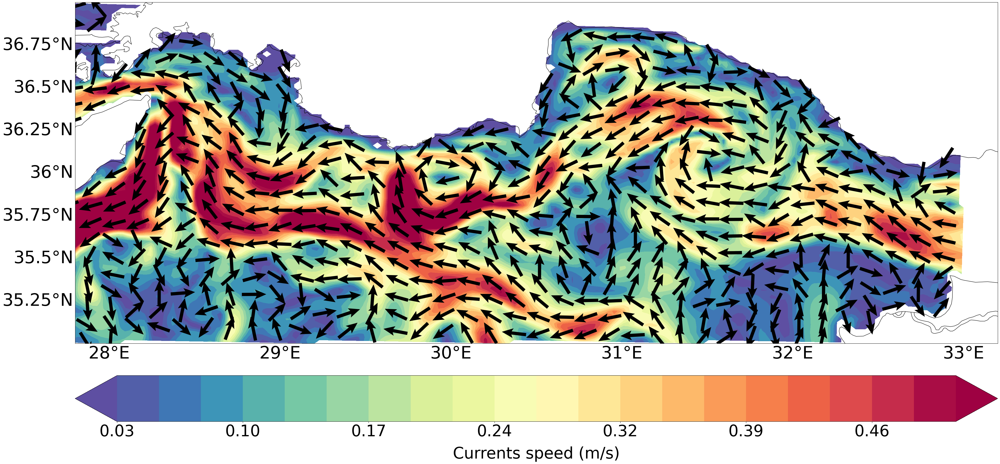

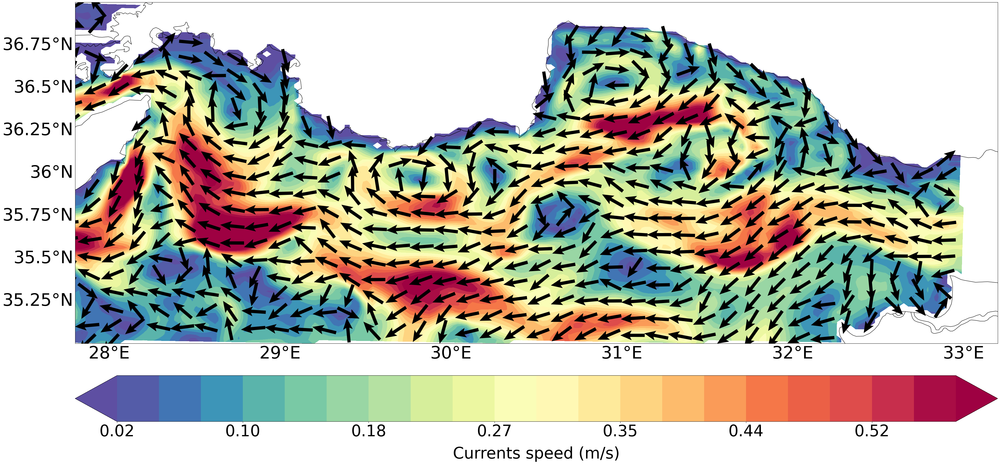

In [ ]:
from matplotlib.patches import Rectangle

List_seasons = ["29/01, 01:00","31/01, 06:00", "AMJ", "JAS", "OND"]

for j in range(0,2):
    fig, axes = plt.subplots(1, 1, figsize=(48, 42), 
    subplot_kw={'projection': ccrs.PlateCarree()})
    #axes = axes.flatten()  # flatten to a 1D array of length 10
    #ax1, ax2 = axes
    ax1 = axes
    # ax1.set_extent([-1, 10, 36, 39]) # for algeria current

    #fig.suptitle(f'Wind and currents forcings - {Region_plots}', x=0.45,y=0.92, 
    #            ha='center',fontsize = 26)
    #plt.rcParams.update({"axes.titlesize": 24,"axes.labelsize": 24})
    #plt.subplots_adjust(hspace=0.2, wspace=0.25)  # increase vertical spacing
    CBAR_SHRINK = 1.0

    step = 21
    bounds_cur_speed,_ = adaptive_percentile_range(cur_speed[j])
    min_cur_speed, max_cur_speed = bounds_cur_speed
    # Define normalization
    norm_1 = mcolors.Normalize(vmin=min_cur_speed, vmax=max_cur_speed)
    levels_1 = np.round(np.linspace(min_cur_speed, max_cur_speed, step), 
                        2)
    levels_1 = np.unique(levels_1)
    cf = ax1.contourf(ds_0_sel.longitude, ds_0_sel.latitude, cur_speed[j],
                    transform=ccrs.PlateCarree(),
                    levels=levels_1,
                    norm=norm_1, extend="both", cmap="Spectral_r")
    cbar = fig.colorbar(cf, pad=0.04, ax=ax1, label="Currents speed (m/s)",
    shrink=CBAR_SHRINK, orientation='horizontal')

    step_norm = 5
    U_norm_cur = np.sqrt(ds_3_sel["ucur"][j,::step_norm,::step_norm]**2 + ds_3_sel["vcur"][j,::step_norm,::step_norm]**2)
    U_cur = ds_3_sel["ucur"][j, ::step_norm, ::step_norm] / U_norm_cur
    V_cur = ds_3_sel["vcur"][j, ::step_norm, ::step_norm] / U_norm_cur
    X = ds_0_sel.longitude[::step_norm,::step_norm]
    Y = ds_0_sel.latitude[::step_norm,::step_norm]

    ax1.quiver(X, Y, U_cur, V_cur, transform=ccrs.PlateCarree(), pivot='mid', 
               width = 0.0035,
                scale_units='xy', scale=7, 
                angles='xy', headlength = 3.5,
                headaxislength = 3)
    style_axis(ax1, cbar=cbar, 
               cbar_tick_fontsize=46)
    cbar.set_label(label="Currents speed (m/s)", size=46, labelpad=20)
    #ax1.set_title("Currents field - Asia Minor", fontsize=24)

    """bounds_wnd_speed,_ = adaptive_percentile_range(wnd_speed[j])
    min_wnd_speed, max_wnd_speed = bounds_wnd_speed
    # Define normalization
    norm_2 = mcolors.Normalize(vmin=min_wnd_speed, vmax=max_wnd_speed)
    levels_2 = np.round(np.linspace(min_wnd_speed, max_wnd_speed, step), 
                        2)
    levels_2 = np.unique(levels_2)
    cf = ax2.contourf(ds_0_sel.longitude, ds_0_sel.latitude, wnd_speed[j],
                    transform=ccrs.PlateCarree(),
                    levels=levels_2,
                    norm=norm_2, extend="both", cmap="Spectral_r")
    cbar = fig.colorbar(cf, pad=0.08, ax=ax2, label="Wind speed (m/s)",
    shrink=CBAR_SHRINK)

    step_norm = 4
    U_norm_wnd = np.sqrt(ds_3_sel["uwnd"][j,::step_norm,::step_norm]**2 + ds_3_sel["vwnd"][j,::step_norm,::step_norm]**2)
    U_wnd = ds_3_sel["uwnd"][j, ::step_norm, ::step_norm]/U_norm_wnd
    V_wnd = ds_3_sel["vwnd"][j, ::step_norm, ::step_norm]/U_norm_wnd
    X = ds_0_sel.longitude[::step_norm,::step_norm]
    Y = ds_0_sel.latitude[::step_norm,::step_norm]

    ax2.quiver(X, Y, U_wnd, V_wnd, transform=ccrs.PlateCarree(), pivot = 'mid', 
               width = 0.004, 
                scale_units='xy', scale=7.2, angles='xy',
                headlength = 3.5, headaxislength = 3.0)
    style_axis(ax2, f"Wind field", cbar=cbar, cbar_tick_fontsize=16)"""

    """lon_min, lon_max = 30.5, 31.5
    lat_min, lat_max = 36.0, 36.5

    for ax in (ax1, ax2):
        roi_box = Rectangle(
            (lon_min, lat_min),
            lon_max - lon_min,
            lat_max - lat_min,
            linewidth=7,
            edgecolor='black',
            facecolor='none',
            transform=ccrs.PlateCarree(),
            zorder=10
        )
        ax.add_patch(roi_box)"""

SWH analysis plots

List for specific regions coordinates (SWH plots analysis)

1) Asia Minor

a) 1st snapshot (29/01, 01:00)

lon_min = [28.1, 29.65, 29.7, 30.9, 32.5],
lon_max = [29, 30.5, 31, 32.35, 33],
lat_min = [35.6, 35.6, 35, 35.7, 35.5],
lat_max = [36.4, 36.3, 35.5, 36.8, 36]

b) 2nd snapshot (31/01, 06:00)

lon_min = [28, 29.5, 29.55, 30.9, 32.5],
lon_max = [29, 30.5, 31, 32.35, 33],
lat_min = [35.55, 35.6, 35, 35.65, 35.45],
lat_max = [36.4, 36.25, 35.5, 36.75, 36]

2) Algeria current

a) 1st snapshot (29/01, 01:00)

lon_min = [0, 0, 4.8, 6.7],
lon_max = [4.7, 4.7, 6, 8.2],
lat_min = [37.6, 36.4, 36.7, 37.5],
lat_max = [38.8, 37.5, 37.9, 38.8]

b) 2nd snapshot (31/01, 06:00)
lon_min = [0, 0, 4.8, 6.75],
lon_max = [4.7, 4.7, 6, 8.2],
lat_min = [37.6, 36.4, 37.45, 37.5],
lat_max = [38.8, 37.5, 38.65, 38.8]

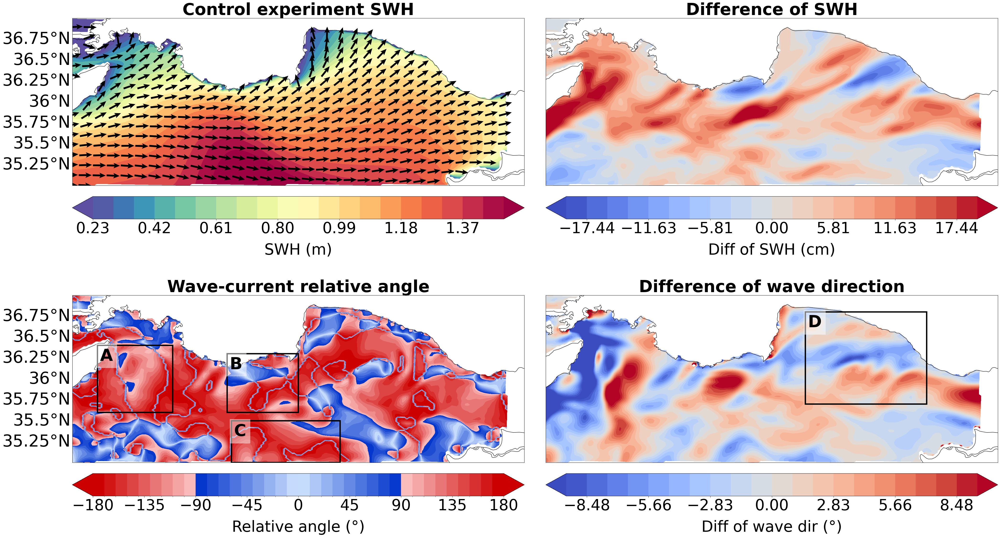

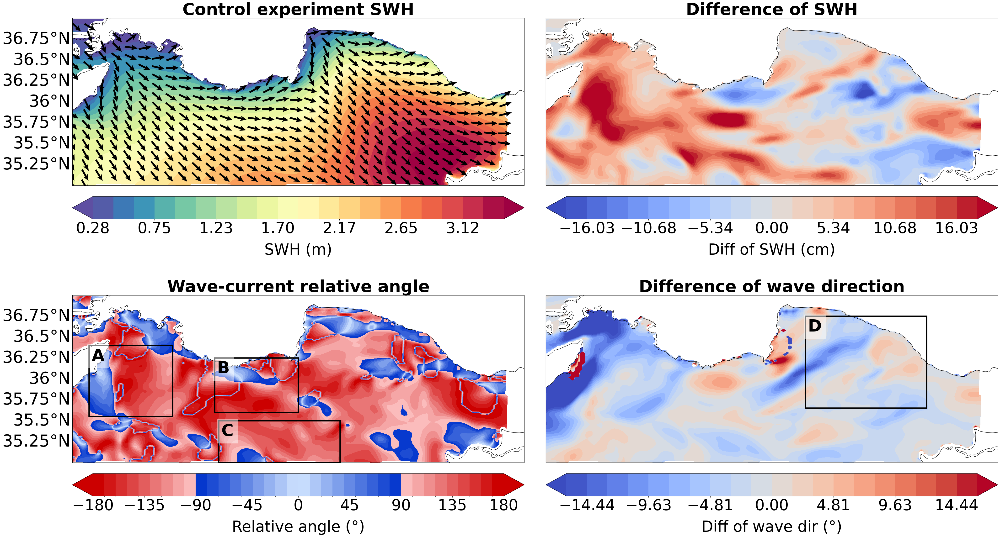

In [ ]:
import os
from matplotlib.colors import TwoSlopeNorm
from matplotlib.patches import Rectangle

List_snapshots = ["Snapshot #1 - 29/01,01:00", "Snapshot #2 - 31/01,06:00"]
format_bounds = [2,2,2]

for j in range(0,2):
    mosaic = """
    AABB
    CCDD
    """
   #EEFF

    fig, ax_dict = plt.subplot_mosaic(
        mosaic,
        figsize=(50,30),
        subplot_kw={'projection': ccrs.PlateCarree()},
        #gridspec_kw={'height_ratios': [1, 1, 1]},
        gridspec_kw={'height_ratios': [1, 1]},
        sharey=True
    )

    #plt.rcParams.update({"axes.titlesize": 20,"axes.labelsize": 20})

    # Assign axis variables
    ax1 = ax_dict["A"]
    ax2 = ax_dict["B"]
    ax3 = ax_dict["C"]
    ax4 = ax_dict["D"]
    #ax5 = ax_dict["E"]
    #ax6 = ax_dict["F"]

    #fig.suptitle(f'{List_snapshots[j]} - {Region_plots}', 
    #             x=0.5 ,y=0.92,  ha='center', fontsize = 24)

    plt.subplots_adjust(hspace=0.01, wspace=0.1)  # increase vertical spacing
    CBAR_SHRINK = 1.0
    
    step = 21
    bounds_hs_no_cur,_ = adaptive_percentile_range(hs_no_cur[j])
    min_hs_no_cur, max_hs_no_cur = bounds_hs_no_cur
    # Define normalization
    norm_1 = mcolors.Normalize(vmin=min_hs_no_cur, vmax=max_hs_no_cur)
    levels_1 = np.round(np.linspace(min_hs_no_cur, max_hs_no_cur, step), 
                        format_bounds[0])
    levels_1 = np.unique(levels_1)
    cf = ax1.contourf(ds_0_sel.longitude,ds_0_sel.latitude,hs_no_cur[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_1,
                    norm=norm_1, extend = "both",cmap="Spectral_r")
    cbar = fig.colorbar(cf,pad=0.04,ax =ax1,label="SWH (m)", 
                        shrink=CBAR_SHRINK, orientation='horizontal')
    cbar.set_label(label="SWH (m)", size=46, labelpad=20)
    style_axis(ax1, title="Control experiment SWH", cbar=cbar,
                cbar_tick_fontsize=46, no_bottom_labels=True)

    step_norm = 6
    U_norm_group_with_cur = c_group_no_cur[j, ::step_norm, ::step_norm]
    U_group_with_cur = u_group_no_cur[j, ::step_norm, ::step_norm] / U_norm_group_with_cur
    V_group_with_cur = v_group_no_cur[j, ::step_norm, ::step_norm] / U_norm_group_with_cur
    X, Y = lon2d[::step_norm, ::step_norm], lat2d[::step_norm, ::step_norm]

    ax1.quiver(X, Y, U_group_with_cur, V_group_with_cur, transform=ccrs.PlateCarree(),
               pivot = 'mid', width = 0.004, 
                scale_units='xy', scale=6.4, angles='xy',
                headlength = 3.5, headaxislength = 3.0)


    bounds_diff_hs,_ = adaptive_percentile_range(diff_hs2d[j])
    min_diff_hs, max_diff_hs = 100*bounds_diff_hs
    # symmetric range
    abs_max = max(abs(min_diff_hs), abs(max_diff_hs))

    # choose normalization automatically
    if min_diff_hs < 0 and max_diff_hs > 0:
        # mixed values → use diverging normalization centered at 0
        norm_2 = TwoSlopeNorm(vmin=-abs_max, vcenter=0, vmax=abs_max)
    else:
        # only positive or only negative → use standard normalization
        norm_2 = mcolors.Normalize(vmin=-abs_max, vmax=abs_max)
    levels_2 = np.round(np.linspace(-abs_max, abs_max, step), 
                        format_bounds[0])
    levels_2 = np.unique(levels_2)
    cf = ax2.contourf(ds_0_sel.longitude,ds_0_sel.latitude,100*diff_hs2d[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_2,
                    norm=norm_2, extend = "both",cmap="coolwarm")
    cbar = fig.colorbar(cf,pad=0.04,ax =ax2,label="Diff of SWH (cm)",
                        shrink=CBAR_SHRINK, orientation='horizontal')
    cbar.set_label(label="Diff of SWH (cm)", size=46, labelpad=20)
    style_axis(ax2, title="Difference of SWH", cbar=cbar, cbar_tick_fontsize=46,
               no_bottom_labels=True, no_left_labels=True)

    angle_bounds = np.linspace(-180, 180, 37)
    angle_norm = BoundaryNorm(angle_bounds, combined_cmap.N)
    ticks = [-180, -135, -90, -45, 0, 45, 90, 135, 180]

    cf = ax3.contourf(ds_0_sel.longitude,ds_0_sel.latitude,rel_angle_wave[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=angle_bounds,
                    norm=angle_norm, extend = "both",cmap=combined_cmap)
    cbar = fig.colorbar(cf,pad=0.04,ax =ax3,label="Relative angle (°)",
                        shrink=CBAR_SHRINK, ticks=ticks, orientation='horizontal')
    cbar.set_label(label="Relative angle (°)", size=46, labelpad=20)
    style_axis(ax3, title="Wave-current relative angle", cbar=cbar, 
               cbar_tick_fontsize=46, no_bottom_labels=True)

    bounds_diff_wave_dir,_ = adaptive_percentile_range(diff_wave_dir2d[j])
    min_diff_wave_dir, max_diff_wave_dir = bounds_diff_wave_dir
    # symmetric range
    abs_max = max(abs(min_diff_wave_dir), abs(max_diff_wave_dir))

    # choose normalization automatically
    if min_diff_wave_dir < 0 and max_diff_wave_dir > 0:
        # mixed values → use diverging normalization centered at 0
        norm_4 = TwoSlopeNorm(vmin=-abs_max, vcenter=0, 
                              vmax=abs_max)
    else:
        # only positive or only negative → use standard normalization
        norm_4 = mcolors.Normalize(vmin=min_diff_wave_dir, 
                                   vmax=max_diff_wave_dir)
    levels_4 = np.round(np.linspace(-abs_max, abs_max, step), 
                        format_bounds[0])
    levels_4 = np.unique(levels_4)
    cf = ax4.contourf(ds_0_sel.longitude,ds_0_sel.latitude,diff_wave_dir2d[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_4,
                    norm=norm_4, extend = "both",cmap="coolwarm")
    cbar = fig.colorbar(cf,pad=0.04,ax =ax4,label="Diff of wave dir (°)",
                        shrink=CBAR_SHRINK, orientation='horizontal')
    cbar.set_label(label="Diff of wave dir (°)", size=46, labelpad=20)
    style_axis(ax4, title="Difference of wave direction", cbar=cbar, 
               cbar_tick_fontsize=46, no_bottom_labels=True, no_left_labels=True)    

    """bounds_vor,_ = adaptive_percentile_range(vor_masked[j])
    min_vor, max_vor = bounds_vor

    # symmetric range
    abs_max = max(abs(min_vor), abs(max_vor))

     # choose normalization automatically
    if min_vor < 0 and min_vor > 0:
        # mixed values → use diverging normalization centered at 0
        norm_5 = TwoSlopeNorm(vmin=-abs_max, vcenter=0, vmax=abs_max)
    else:
        # only positive or only negative → use standard normalization
        norm_5 = mcolors.Normalize(vmin=min_vor, vmax=max_vor)
    levels_5 = np.round(np.linspace(-abs_max, abs_max, step), 
                        7)
    levels_5 = np.unique(levels_5)
    cf = ax5.contourf(ds_0_sel.longitude,ds_0_sel.latitude,vor_masked[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_5,
                    norm=norm_5, extend = "both",cmap="coolwarm")
    cbar = fig.colorbar(cf,pad=0.08,ax =ax5,label="Vorticity (1/s)",
                        shrink=CBAR_SHRINK, orientation='horizontal')
    cbar.set_label(label="Vorticity (1/s)", size=46, labelpad=20)
    cbar.ax.yaxis.get_offset_text().set_fontsize(26)
    style_axis(ax5, title="Vorticity", cbar=cbar, cbar_tick_fontsize=46)

    bounds_step,_ = adaptive_percentile_range(div_masked[j])
    min_step, max_step = bounds_step

    # symmetric range
    abs_max = max(abs(min_step), abs(max_step))
    
     # choose normalization automatically
    if min_step < 0 and max_step > 0:
        # mixed values → use diverging normalization centered at 0
        norm_6 = TwoSlopeNorm(vmin=-abs_max, vcenter=0, vmax=abs_max)
    else:
        # only positive or only negative → use standard normalization
        norm_6 = mcolors.Normalize(vmin=min_step, vmax=max_step)
    # Define normalization
    levels_6 = np.round(np.linspace(-abs_max, abs_max, step), 
                        7)
    levels_6 = np.unique(levels_6)
    cf = ax6.contourf(ds_0_sel.longitude,ds_0_sel.latitude,div_masked[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_6,
                    norm=norm_6, extend = "both",cmap="coolwarm")
    cbar = fig.colorbar(cf,pad=0.08,ax =ax6,label="Divergence (1/s)",
                        shrink=CBAR_SHRINK, orientation='horizontal')
    cbar.set_label(label="Divergence (1/s)", size=46, labelpad=20)
    cbar.ax.yaxis.get_offset_text().set_fontsize(26) 
    style_axis(ax6, title="Divergence", cbar=cbar, cbar_tick_fontsize=46,
               no_left_labels=True)"""

    labels = ["A", "B", "C", "D"] # E

    if j == 0: # 1st snapshot
        lon_min = [28.1, 29.65, 29.7, 30.9, 32.5]
        lon_max = [29, 30.5, 31, 32.35, 33]
        lat_min = [35.6, 35.6, 35, 35.7, 35.5]
        lat_max = [36.4, 36.3, 35.5, 36.8, 36]
    else: # 2nd snapshot
        lon_min = [28, 29.5, 29.55, 30.9, 32.5]
        lon_max = [29, 30.5, 31, 32.35, 33]
        lat_min = [35.55, 35.6, 35, 35.65, 35.45]
        lat_max = [36.4, 36.25, 35.5, 36.75, 36]

    for ax in (ax3, ax4):
        if ax == ax3:
            roi_box_1 = Rectangle(
                (lon_min[0], lat_min[0]), lon_max[0] - lon_min[0], lat_max[0] - lat_min[0],
                linewidth=4, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree(), zorder=10)
            roi_box_2 = Rectangle(
                (lon_min[1], lat_min[1]), lon_max[1] - lon_min[1], lat_max[1] - lat_min[1],
                linewidth=4, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree(), zorder=10)
            roi_box_3 = Rectangle(
                (lon_min[2], lat_min[2]), lon_max[2] - lon_min[2], lat_max[2] - lat_min[2],
                linewidth=4, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree(), zorder=10)
            ax.add_patch(roi_box_1)
            box_text(ax,labels=labels[0],lon_min=lon_min[0],lat_max=lat_max[0])
            ax.add_patch(roi_box_2)
            box_text(ax,labels=labels[1],lon_min=lon_min[1],lat_max=lat_max[1])
            ax.add_patch(roi_box_3)
            box_text(ax,labels=labels[2],lon_min=lon_min[2],lat_max=lat_max[2])
        else:
            roi_box_4 = Rectangle(
                (lon_min[3], lat_min[3]), lon_max[3] - lon_min[3], lat_max[3] - lat_min[3],
                linewidth=4, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree(), zorder=10)
            ax.add_patch(roi_box_4)
            box_text(ax,labels=labels[3],lon_min=lon_min[3],lat_max=lat_max[3])
        # additional fifth region
        """roi_box_5 = Rectangle(
            (lon_min[4], lat_min[4]), lon_max[4] - lon_min[4], lat_max[4] - lat_min[4],
            linewidth=3, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree(), zorder=10)"""

        # if you want boxes to be shown in every plot
        """ax.add_patch(roi_box_1)
        box_text(ax,labels=labels[0],lon_min=lon_min[0],lat_max=lat_max[0])
        ax.add_patch(roi_box_2)
        box_text(ax,labels=labels[1],lon_min=lon_min[1],lat_max=lat_max[1])
        ax.add_patch(roi_box_3)
        box_text(ax,labels=labels[2],lon_min=lon_min[2],lat_max=lat_max[2])
        ax.add_patch(roi_box_4)
        box_text(ax,labels=labels[3],lon_min=lon_min[3],lat_max=lat_max[3])"""
        #ax.add_patch(roi_box_5)
        #box_text(ax,labels=labels[4],lon_min=lon_min[4],lat_max=lat_max[4])

Wave direction plots analysis

List for specific regions coordinates (wave direction plots analysis)

1) Asia Minor

a) 1st snapshot (29/01, 01:00)

lon_min = [28.45, 29.55, 30.8, 32.4],
lon_max = [29.05, 30.3, 31.5, 33],
lat_min = [35.6, 35.6, 36.1, 35.4],
lat_max = [36.2, 36.2, 36.5, 36]

b) 2nd snapshot (31/01, 06:00)

lon_min = [28.3, 29.4, 30.8, 31.5],
lon_max = [28.9, 30.25, 31.6, 32.2],
lat_min = [35.9, 35.7, 36.05, 35.3],
lat_max = [36.3, 36.2, 36.45, 35.9]

2) Algerian current

lon_min = [0.9, 1, 4.8, 6.7],
lon_max = [1.9, 2.6, 6, 8.2],
lat_min = [37.4, 36.5, 36.7, 37.4],
lat_max = [38.3, 37.2, 37.9, 38.8]

lon_min = [0.9, 1, 4.4, 6.7],
lon_max = [2, 2.6, 5.9, 8.2],
lat_min = [37.3, 36.5, 37.5, 37.5],
lat_max = [38.3, 37.2, 38.7, 38.8]

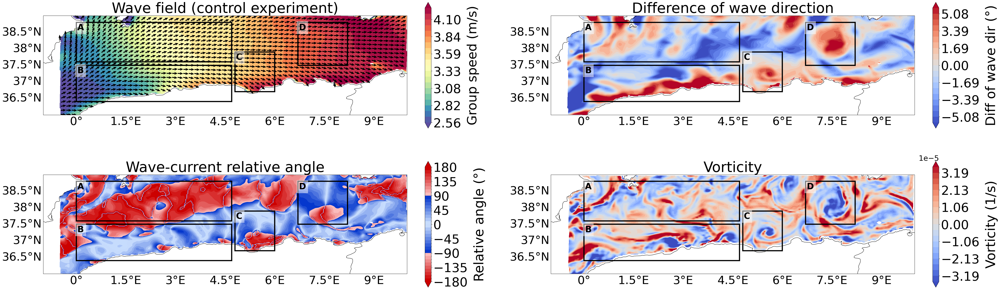

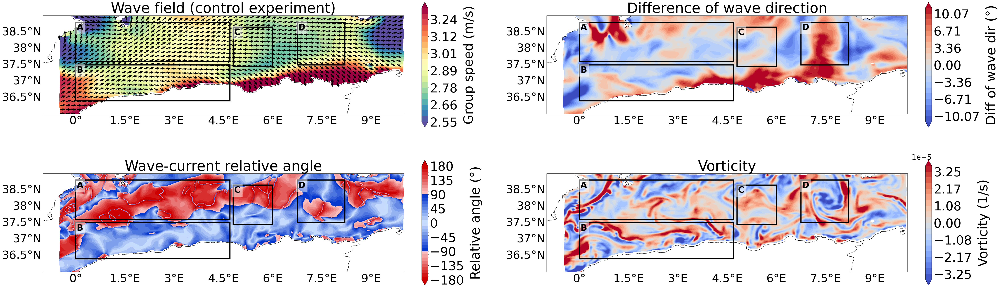

In [ ]:
import os
from matplotlib.colors import TwoSlopeNorm
from matplotlib.patches import Rectangle

List_snapshots = ["Snapshot #1", "31/01,06:00"]
format_bounds = [2,2,2]

for j in range(0,2):
    """fig, axes = plt.subplots(2, 2, figsize=(17, 17), subplot_kw=
                            {'projection': ccrs.PlateCarree()})
    ax1, ax2, ax3, ax4 = axes.flatten()"""

    mosaic = """
    AABB
    CCDD
    """
    #.EE.

    fig, ax_dict = plt.subplot_mosaic(
        mosaic,
        figsize=(60, 20),
        subplot_kw={'projection': ccrs.PlateCarree()},
        gridspec_kw={'height_ratios': [1, 1]},
        sharey=True
    )

    #plt.rcParams.update({"axes.titlesize": 20,"axes.labelsize": 20})

    # Assign axis variables
    ax1 = ax_dict["A"]
    ax2 = ax_dict["B"]
    ax3 = ax_dict["C"]
    ax4 = ax_dict["D"]
    #ax5 = ax_dict["E"]

    #fig.suptitle(f'{List_snapshots[j]} - {Region_plots}', x=0.5,y=0.92, 
    #            ha='center',fontsize = 24)
    #plt.rcParams.update({"axes.titlesize": 20,"axes.labelsize": 20})
    plt.subplots_adjust(hspace=0.01, wspace=0.3)  # increase vertical spacing
    CBAR_SHRINK = 0.8

    step = 21
    bounds_wnd_speed,_ = adaptive_percentile_range(c_group_no_cur[j])
    min_wnd_speed, max_wnd_speed = bounds_wnd_speed
    # Define normalization
    norm_1 = mcolors.Normalize(vmin=min_wnd_speed, vmax=max_wnd_speed)
    levels_1 = np.round(np.linspace(min_wnd_speed, max_wnd_speed, step), 
                        2)
    levels_1 = np.unique(levels_1)
    cf = ax1.contourf(ds_0_sel.longitude, ds_0_sel.latitude, c_group_no_cur[j],
                    transform=ccrs.PlateCarree(),
                    levels=levels_1,
                    norm=norm_1, extend="both", cmap="Spectral_r")
    cbar = fig.colorbar(cf, pad=0.04, ax=ax1, label="Wave group speed (m/s)",
    shrink=CBAR_SHRINK)

    step_norm = 6
    U_norm_group_with_cur = c_group_no_cur[j, ::step_norm, ::step_norm]
    U_group_with_cur = u_group_no_cur[j, ::step_norm, ::step_norm] / U_norm_group_with_cur
    V_group_with_cur = v_group_no_cur[j, ::step_norm, ::step_norm] / U_norm_group_with_cur
    X, Y = lon2d[::step_norm, ::step_norm], lat2d[::step_norm, ::step_norm]

    ax1.quiver(X, Y, U_group_with_cur, V_group_with_cur, transform=ccrs.PlateCarree(),
               pivot = 'mid', width = 0.0025,   
                scale_units='xy', scale=6.25, angles='xy',
                headlength = 3.5, headaxislength = 3.0)
    cbar.set_label(label="Group speed (m/s)", size=45, labelpad=20)
    style_axis(ax1, title="Wave field (control experiment)", cbar=cbar, 
               cbar_tick_fontsize=44)

    bounds_diff_wave_dir,_ = adaptive_percentile_range(diff_wave_dir2d[j])
    min_diff_wave_dir, max_diff_wave_dir = bounds_diff_wave_dir
    # symmetric range
    abs_max = max(abs(min_diff_wave_dir), abs(max_diff_wave_dir))

    # choose normalization automatically
    if min_diff_wave_dir < 0 and max_diff_wave_dir > 0:
        # mixed values → use diverging normalization centered at 0
        norm_2 = TwoSlopeNorm(vmin=-abs_max, vcenter=0, 
                              vmax=abs_max)
    else:
        # only positive or only negative → use standard normalization
        norm_2 = mcolors.Normalize(vmin=min_diff_wave_dir, 
                                   vmax=max_diff_wave_dir)
    levels_2 = np.round(np.linspace(-abs_max, abs_max, step), 
                        format_bounds[0])
    levels_2 = np.unique(levels_2)
    cf = ax2.contourf(ds_0_sel.longitude,ds_0_sel.latitude,diff_wave_dir2d[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_2,
                    norm=norm_2, extend = "both",cmap="coolwarm")
    cbar = fig.colorbar(cf,pad=0.04,ax =ax2,label="Diff of wave dir (°)",
                        shrink=CBAR_SHRINK)
    cbar.set_label(label="Diff of wave dir (°)", size=46, labelpad=20)
    style_axis(ax2, title="Difference of wave direction", cbar=cbar, 
               cbar_tick_fontsize=44)

    angle_bounds = np.linspace(-180, 180, 37)
    angle_norm = BoundaryNorm(angle_bounds, combined_cmap.N)
    ticks = [-180, -135, -90, -45, 0, 45, 90, 135, 180]

    cf = ax3.contourf(ds_0_sel.longitude,ds_0_sel.latitude,rel_angle_wave[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=angle_bounds,
                    norm=angle_norm, extend = "both",cmap=combined_cmap)
    cbar = fig.colorbar(cf,pad=0.04,ax =ax3,label="Relative angle (°)",
                        shrink=CBAR_SHRINK, ticks=ticks)
    cbar.set_label(label="Relative angle (°)", size=46, labelpad=20)
    style_axis(ax3, title="Wave-current relative angle", cbar=cbar,
                cbar_tick_fontsize=44)


    bounds_vor,_ = adaptive_percentile_range(vor_masked[j])
    min_vor, max_vor = bounds_vor
    # symmetric range
    abs_max = max(abs(min_vor), abs(max_vor))

    # Define normalization
    norm_4 = mcolors.Normalize(vmin=-abs_max, vmax=abs_max)
    levels_4 = np.round(np.linspace(-abs_max, abs_max, step), 
                        7)
    levels_4 = np.unique(levels_4)
    cf = ax4.contourf(ds_0_sel.longitude,ds_0_sel.latitude,vor_masked[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_4,
                    norm=norm_4, extend = "both",cmap="coolwarm")
    cbar = fig.colorbar(cf,pad=0.04,ax =ax4,label="Vorticity (1/s)",
                        shrink=CBAR_SHRINK)
    cbar.set_label(label="Vorticity (1/s)", size=46, labelpad=20)
    cbar.ax.yaxis.get_offset_text().set_fontsize(26)
    style_axis(ax4, title="Vorticity", cbar=cbar, cbar_tick_fontsize=44)

    """bounds_cur_speed,_ = adaptive_percentile_range(cur_speed[j])
    min_cur_speed, max_cur_speed = bounds_cur_speed
    # Define normalization
    norm_5 = mcolors.Normalize(vmin=min_cur_speed, vmax=max_cur_speed)
    levels_5 = np.round(np.linspace(min_cur_speed, max_cur_speed, step), 
                        format_bounds[0])
    levels_5 = np.unique(levels_5)
    cf = ax5.contourf(ds_0_sel.longitude,ds_0_sel.latitude,cur_speed[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_5,
                    norm=norm_5, extend = "both",cmap="Spectral_r")
    cbar = fig.colorbar(cf,pad=0.08,ax =ax5,label="cur_speed (m/s)",
                        shrink=CBAR_SHRINK)
    style_axis(ax5, title="Currents field", cbar=cbar, cbar_tick_fontsize=16)

    step_norm = 5
    U_norm = np.sqrt(ucur[j,::step_norm,::step_norm]**2 + vcur[j,::step_norm,::step_norm]**2)
    U = ucur[j,::step_norm,::step_norm]/U_norm
    V = vcur[j,::step_norm,::step_norm]/U_norm
    X = ds_0_sel.longitude[::step_norm,::step_norm]
    Y = ds_0_sel.latitude[::step_norm,::step_norm]

    ax5.quiver(X,Y,U,V, transform=ccrs.PlateCarree(), scale_units='xy', pivot = 'mid', width=0.002,
               scale = 5.5, angles = 'xy', headlength = 3.5,
                   headaxislength = 3.0)"""

    labels = ["A", "B", "C", "D"]

    if j == 0: # 1st snapshot
        lon_min = [0, 0, 4.8, 6.7]
        lon_max = [4.7, 4.7, 6, 8.2]
        lat_min = [37.6, 36.4, 36.7, 37.5]
        lat_max = [38.8, 37.5, 37.9, 38.8]
    else: # 2nd snapshot
        lon_min = [0, 0, 4.8, 6.75]
        lon_max = [4.7, 4.7, 6, 8.2]
        lat_min = [37.6, 36.4, 37.45, 37.5]
        lat_max = [38.8, 37.5, 38.65, 38.8]
        

    for ax in (ax1, ax2, ax3, ax4):
        roi_box_1 = Rectangle(
            (lon_min[0], lat_min[0]), lon_max[0] - lon_min[0], lat_max[0] - lat_min[0],
            linewidth=4, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree(), zorder=10)
        roi_box_2 = Rectangle(
            (lon_min[1], lat_min[1]), lon_max[1] - lon_min[1], lat_max[1] - lat_min[1],
            linewidth=4, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree(), zorder=10)
        roi_box_3 = Rectangle(
            (lon_min[2], lat_min[2]), lon_max[2] - lon_min[2], lat_max[2] - lat_min[2],
            linewidth=4, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree(), zorder=10)
        roi_box_4 = Rectangle(
            (lon_min[3], lat_min[3]), lon_max[3] - lon_min[3], lat_max[3] - lat_min[3],
            linewidth=4, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree(), zorder=10)
        ax.add_patch(roi_box_1)
        box_text(ax,labels=labels[0],lon_min=lon_min[0],lat_max=lat_max[0])
        ax.add_patch(roi_box_2)
        box_text(ax,labels=labels[1],lon_min=lon_min[1],lat_max=lat_max[1])
        ax.add_patch(roi_box_3)
        box_text(ax,labels=labels[2],lon_min=lon_min[2],lat_max=lat_max[2])
        ax.add_patch(roi_box_4)
        box_text(ax,labels=labels[3],lon_min=lon_min[3],lat_max=lat_max[3])